데이터 로드

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
!wget https://github.com/younggon2/Education-ComputerVision-DeepLearning/raw/master/res/Lung_Segmentation.zip

--2025-03-14 08:56:53--  https://github.com/younggon2/Education-ComputerVision-DeepLearning/raw/master/res/Lung_Segmentation.zip
Resolving github.com (github.com)... 140.82.121.3
Connecting to github.com (github.com)|140.82.121.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://media.githubusercontent.com/media/younggon2/Education-ComputerVision-DeepLearning/master/res/Lung_Segmentation.zip [following]
--2025-03-14 08:56:53--  https://media.githubusercontent.com/media/younggon2/Education-ComputerVision-DeepLearning/master/res/Lung_Segmentation.zip
Resolving media.githubusercontent.com (media.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.111.133, ...
Connecting to media.githubusercontent.com (media.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 56097894 (53M) [application/zip]
Saving to: ‘Lung_Segmentation.zip’

Lung_Segmentation.z 100%[===================>]  53.

In [ ]:
!unzip Lung_Segmentation.zip

Archive:  Lung_Segmentation.zip
  inflating: image/resize_CHNCXR_0001_0.png  
  inflating: image/resize_CHNCXR_0002_0.png  
  inflating: image/resize_CHNCXR_0003_0.png  
  inflating: image/resize_CHNCXR_0004_0.png  
  inflating: image/resize_CHNCXR_0005_0.png  
  inflating: image/resize_CHNCXR_0006_0.png  
  inflating: image/resize_CHNCXR_0007_0.png  
  inflating: image/resize_CHNCXR_0008_0.png  
  inflating: image/resize_CHNCXR_0009_0.png  
  inflating: image/resize_CHNCXR_0010_0.png  
  inflating: image/resize_CHNCXR_0011_0.png  
  inflating: image/resize_CHNCXR_0012_0.png  
  inflating: image/resize_CHNCXR_0013_0.png  
  inflating: image/resize_CHNCXR_0014_0.png  
  inflating: image/resize_CHNCXR_0015_0.png  
  inflating: image/resize_CHNCXR_0016_0.png  
  inflating: image/resize_CHNCXR_0017_0.png  
  inflating: image/resize_CHNCXR_0018_0.png  
  inflating: image/resize_CHNCXR_0019_0.png  
  inflating: image/resize_CHNCXR_0020_0.png  
  inflating: image/resize_CHNCXR_0021_0.png  
  

밝기값을 기준으로 심장 포함 마스크만 따로 분류

In [ ]:
import os
import numpy as np
import cv2
from tqdm import tqdm

def analyze_mask_brightness(image_path, mask_path):
    """
    마스크의 좌우 폐 영역 밝기값 비율 분석 (Contour 기반)
    """
    # 이미지와 마스크를 그레이스케일로 로드
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    if image is None or mask is None:
        return None

    # 이진화 (마스크에서 폐와 배경을 명확하게 구분)
    _, binary_mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)

    # Contour (폐 영역의 경계선) 검출
    contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # 면적이 100이상인 윤곽선만 선택해 작은 노이즈들은 제거
    contours = [c for c in contours if cv2.contourArea(c) > 100]

    # 좌우 폐를 위한 빈 마스크 생성
    h, w = binary_mask.shape
    left_lung_mask = np.zeros_like(binary_mask)
    right_lung_mask = np.zeros_like(binary_mask)

    if len(contours) < 2:
        # 폐가 2개 미만으로 감지된 경우 이미지 중앙을 기준으로 좌우 분리
        right_lung_mask[:, :w//2] = binary_mask[:, :w//2]
        left_lung_mask[:, w//2:] = binary_mask[:, w//2:]
    else:
        # 면적이 큰 순서대로 정렬하여 가장 큰 contour 2개 선택
        contours = sorted(contours, key=cv2.contourArea, reverse=True)[:2]

        # 각 윤곽선의 중심점을 계산하여 좌우 구분
        centers = []
        for c in contours:
            M = cv2.moments(c)
            if M["m00"] != 0:
                cx = int(M["m10"] / M["m00"])
                centers.append((cx, c))

        # x좌표를 기준으로 정렬
        centers.sort(key=lambda x: x[0])

        # 우측 폐 (이미지 좌측)
        cv2.drawContours(right_lung_mask, [centers[0][1]], -1, 255, -1)

        # 좌측 폐 (이미지 우측)
        cv2.drawContours(left_lung_mask, [centers[1][1]], -1, 255, -1)

    # 각 폐 영역의 원본 이미지 밝기값 분석
    left_lung_pixels = image[left_lung_mask > 0]
    right_lung_pixels = image[right_lung_mask > 0]

    if len(left_lung_pixels) == 0 or len(right_lung_pixels) == 0:
        return None

    # 밝기값 비율 계산
    left_brightness = np.mean(left_lung_pixels)
    right_brightness = np.mean(right_lung_pixels)
    brightness_ratio = left_brightness / right_brightness if right_brightness > 0 else 0

    return brightness_ratio

def find_heart_included_masks(image_dir, label_dir, output_dir, brightness_threshold=1.1):
    """
    심장 영역이 포함된 마스크 찾기 및 저장
    """
    # 출력 디렉토리 생성
    os.makedirs(output_dir, exist_ok=True)
    os.makedirs(os.path.join(output_dir, 'images'), exist_ok=True)
    os.makedirs(os.path.join(output_dir, 'masks'), exist_ok=True)

    # 결과 저장을 위한 리스트
    heart_included_files = []

    # 모든 마스크 파일 처리
    mask_files = [f for f in os.listdir(label_dir) if f.endswith('.png')]
    print(f"총 {len(mask_files)}개의 마스크 파일 분석 중...")

    for filename in tqdm(mask_files):
        image_path = os.path.join(image_dir, filename)
        mask_path = os.path.join(label_dir, filename)

        # 밝기값 비율 분석
        brightness_ratio = analyze_mask_brightness(image_path, mask_path)

        if brightness_ratio is None:
            continue

        # 심장 영역 포함 여부 판단
        if brightness_ratio >= brightness_threshold:
            heart_included_files.append({
                'filename': filename,
                'brightness_ratio': brightness_ratio
            })

            # 파일 복사
            cv2.imwrite(os.path.join(output_dir, 'images', filename),
                       cv2.imread(image_path))
            cv2.imwrite(os.path.join(output_dir, 'masks', filename),
                       cv2.imread(mask_path))

    # 결과 저장
    with open(os.path.join(output_dir, 'heart_included_files.txt'), 'w') as f:
        f.write("Filename,Brightness Ratio\n")
        for item in sorted(heart_included_files, key=lambda x: x['brightness_ratio'], reverse=True):
            f.write(f"{item['filename']},{item['brightness_ratio']:.3f}\n")

    print(f"\n분석 완료!")
    print(f"총 {len(heart_included_files)}개의 심장 영역 포함 마스크를 찾았습니다.")
    print(f"결과가 {output_dir} 디렉토리에 저장되었습니다.")

    return heart_included_files

# 실행
image_dir = "/content/image/"
label_dir = "/content/label/"
output_dir = "/content/heart_included_masks/"

results = find_heart_included_masks(image_dir, label_dir, output_dir)

총 566개의 마스크 파일 분석 중...


100%|██████████| 566/566 [00:02<00:00, 191.40it/s]


분석 완료!
총 56개의 심장 영역 포함 마스크를 찾았습니다.
결과가 /content/heart_included_masks/ 디렉토리에 저장되었습니다.


분류 후 (56개의) 마스크들에 대해 시각화

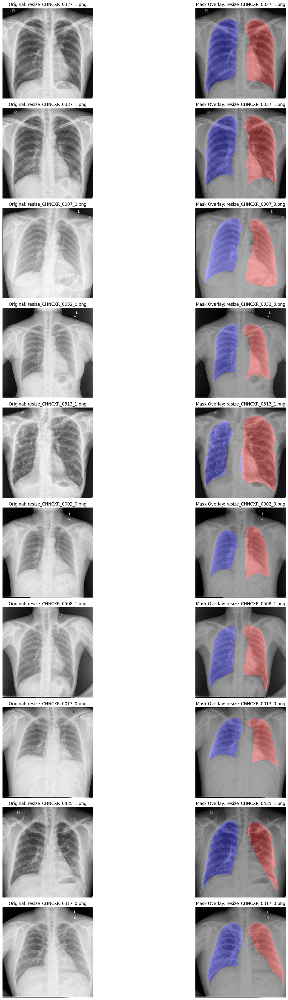

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
import random

def visualize_random_samples(output_dir, num_samples=10):
    """
    심장 영역 포함 마스크 중 랜덤하게 num_samples개를 선택하여 시각화
    """
    # 이미지와 마스크 경로
    images_dir = os.path.join(output_dir, 'images')
    masks_dir = os.path.join(output_dir, 'masks')

    # 파일 목록 가져오기
    files = os.listdir(images_dir)

    # 랜덤하게 num_samples개 선택
    selected_files = random.sample(files, num_samples)

    # 시각화
    plt.figure(figsize=(20, 4*num_samples))

    for idx, filename in enumerate(selected_files):
        # 원본 이미지 로드
        image_path = os.path.join(images_dir, filename)
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

        # 마스크 이미지 로드
        mask_path = os.path.join(masks_dir, filename)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        # 원본 이미지 표시
        plt.subplot(num_samples, 2, 2*idx + 1)
        plt.imshow(image, cmap='gray')
        plt.title(f"Original: {filename}")
        plt.axis('off')

        # 마스크 오버레이 표시
        plt.subplot(num_samples, 2, 2*idx + 2)
        plt.imshow(image, cmap='gray')

        # 마스크 오버레이 (빨간색: 좌측 폐, 파란색: 우측 폐)
        overlay = np.zeros((*image.shape, 3))
        h, w = mask.shape
        left_mask = np.zeros_like(mask)
        right_mask = np.zeros_like(mask)
        left_mask[:, w//2:] = mask[:, w//2:]    # 환자의 좌측 폐 (이미지 우측)
        right_mask[:, :w//2] = mask[:, :w//2]   # 환자의 우측 폐 (이미지 좌측)

        overlay[left_mask > 0] = [1, 0, 0]   # 빨간색
        overlay[right_mask > 0] = [0, 0, 1]   # 파란색

        plt.imshow(overlay, alpha=0.3)
        plt.title(f"Mask Overlay: {filename}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# 실행
output_dir = "/content/heart_included_masks/"
visualize_random_samples(output_dir, num_samples=10)

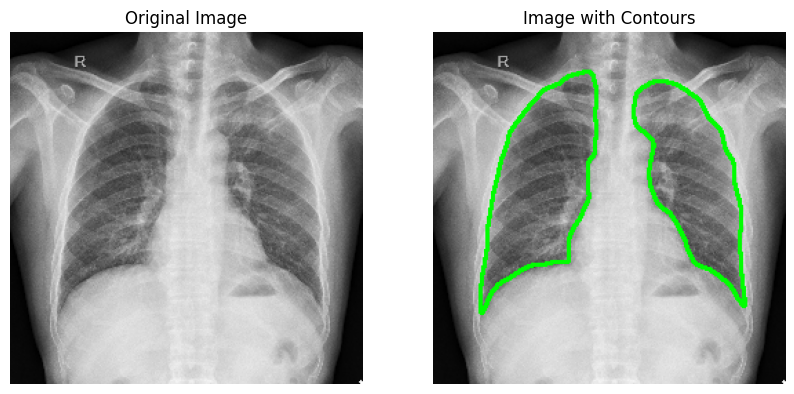

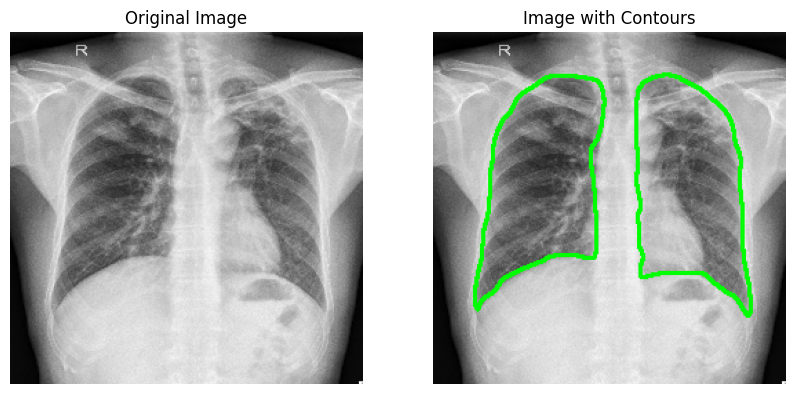

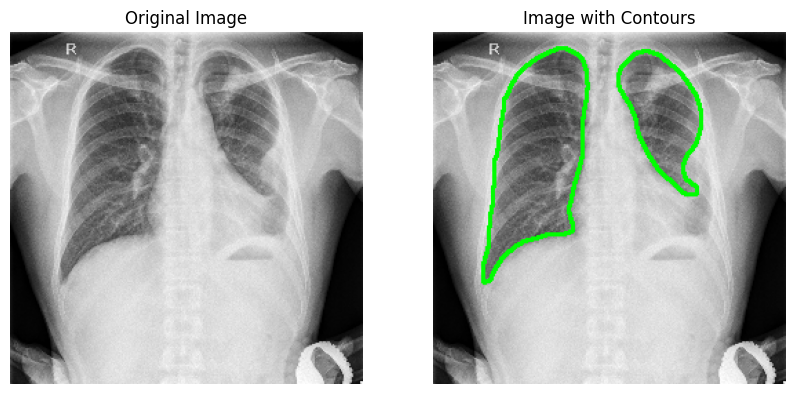

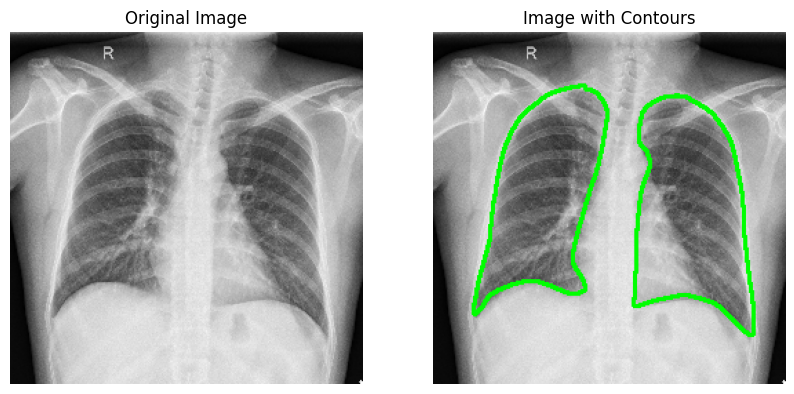

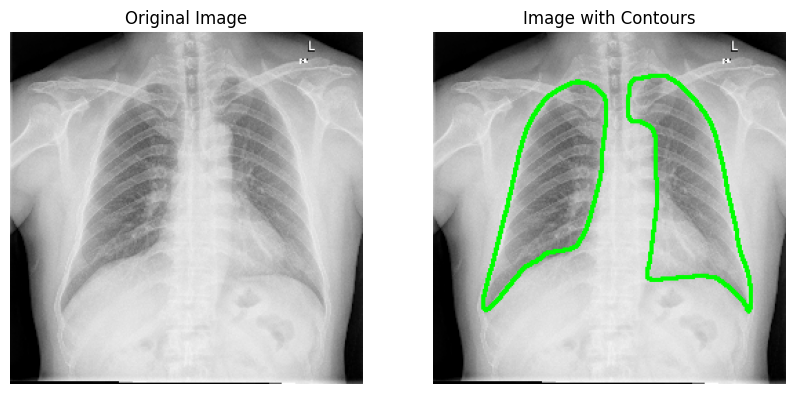

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random

def visualize_contours(image_path, mask_path):
    # 이미지와 마스크 로드
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    # 이진화
    _, binary_mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)

    # 윤곽선 검출
    contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # 윤곽선 그리기
    contour_image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
    cv2.drawContours(contour_image, contours, -1, (0, 255, 0), 2)

    # 이미지 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(image, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(contour_image)
    plt.title('Image with Contours')
    plt.axis('off')

    plt.show()

def visualize_random_images(image_dir, mask_dir, num_images=5):
    # 이미지 파일 목록 가져오기
    image_files = [f for f in os.listdir(image_dir) if f.endswith('.png')]
    mask_files = [f for f in os.listdir(mask_dir) if f.endswith('.png')]

    # 랜덤으로 이미지 선택
    selected_files = random.sample(image_files, num_images)

    for file in selected_files:
        image_path = os.path.join(image_dir, file)
        mask_path = os.path.join(mask_dir, file)
        visualize_contours(image_path, mask_path)

# 디렉토리 경로 설정
image_dir = '/content/heart_included_masks/images'
mask_dir = '/content/heart_included_masks/masks'

# 랜덤 이미지 시각화 함수 호출
visualize_random_images(image_dir, mask_dir)

 심장 영역 추정

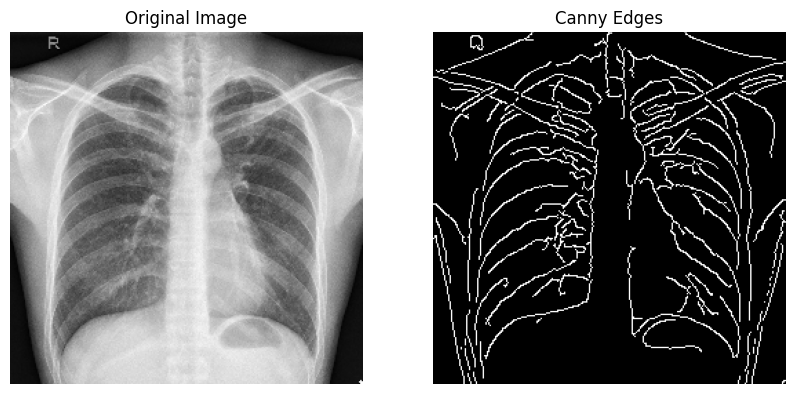

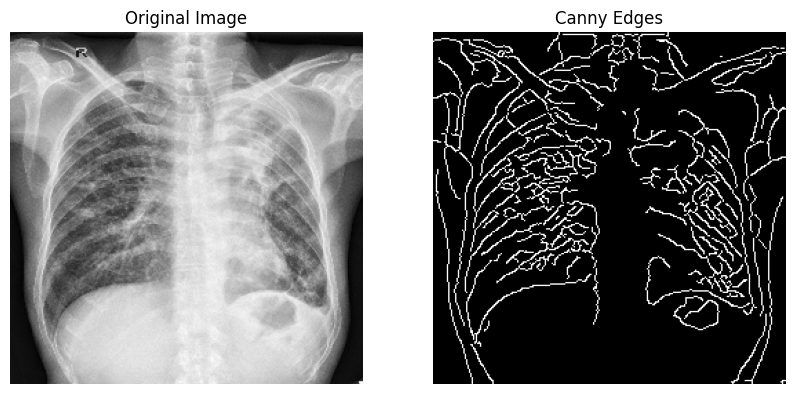

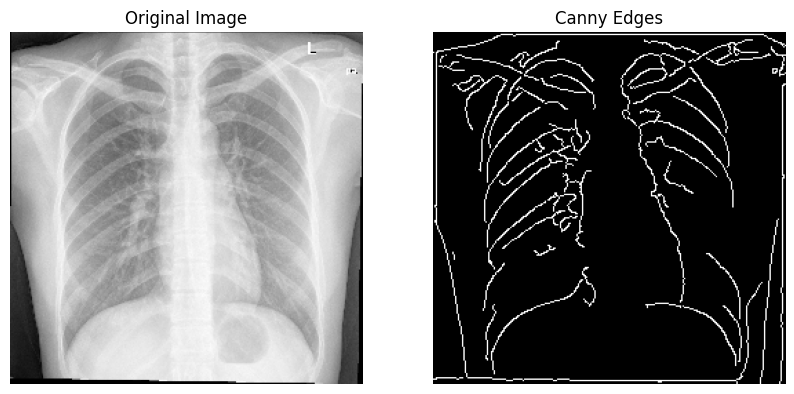

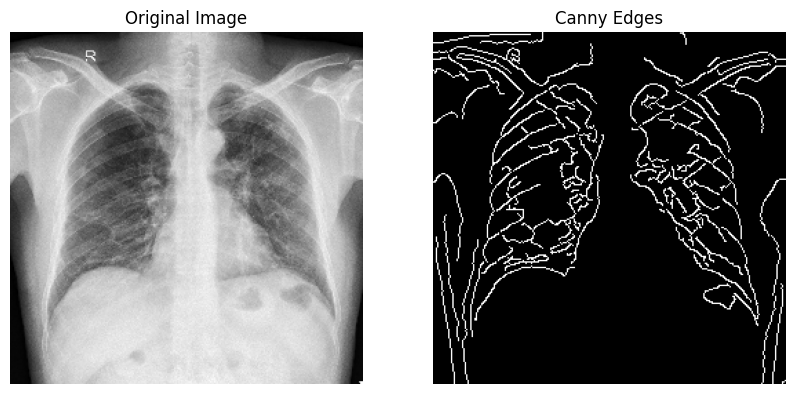

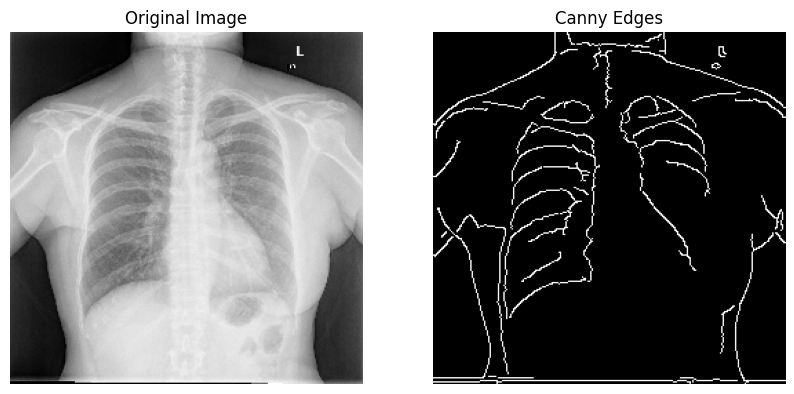

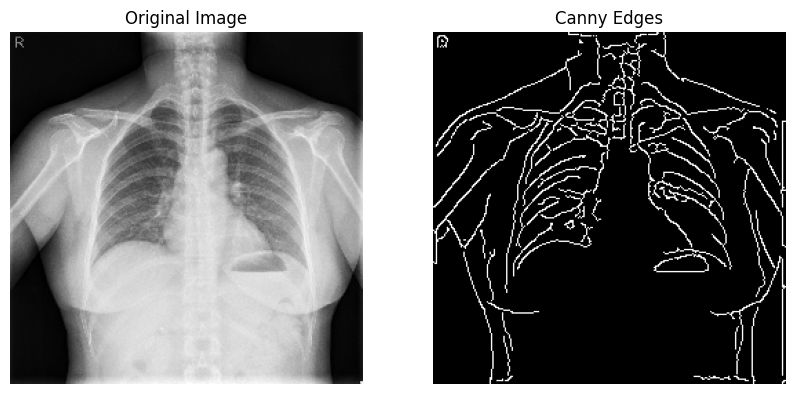

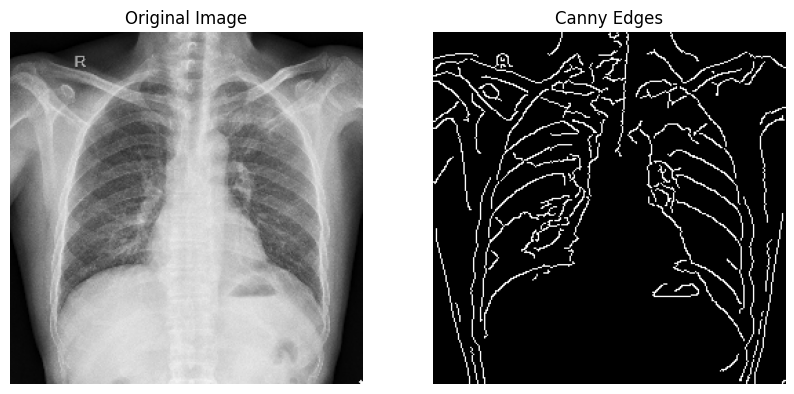

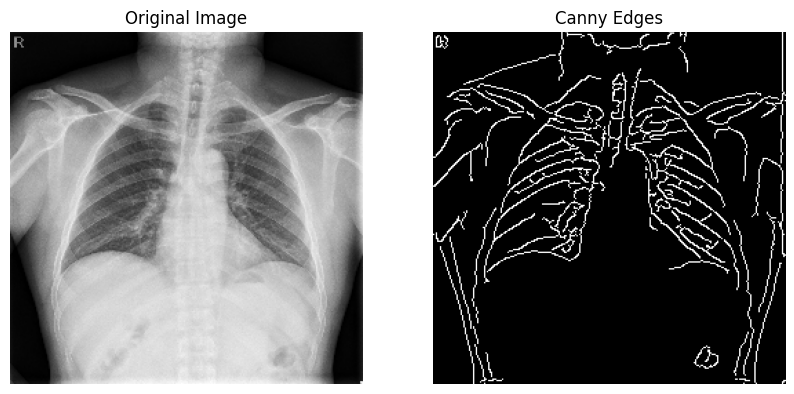

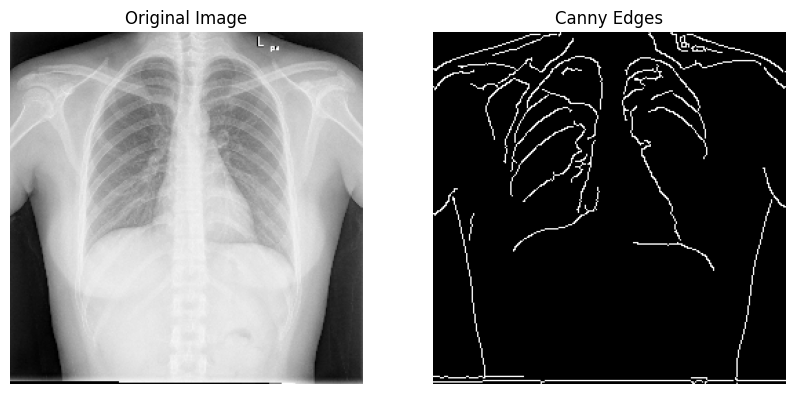

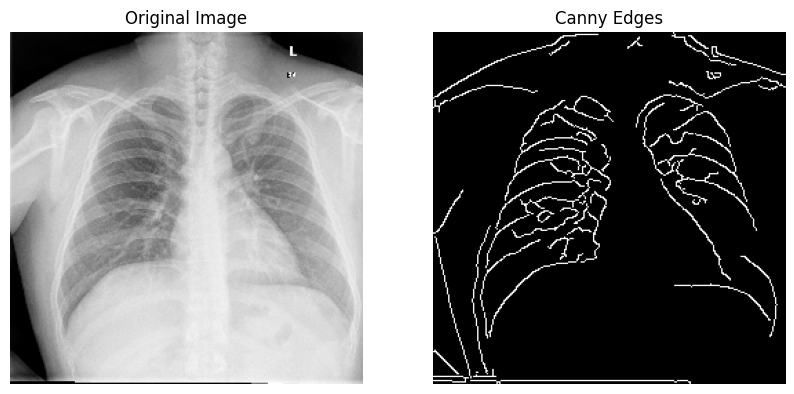

In [ ]:
import cv2
import os
import random
import matplotlib.pyplot as plt

def canny_edge_detection(image_path):
    # 이미지 로드
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # 가우시안 블러 적용
    blurred_image = cv2.GaussianBlur(image, (5, 5), 1.4)

    # Canny 에지 검출
    edges = cv2.Canny(blurred_image, threshold1=30, threshold2=100)

    # 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(image, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(edges, cmap='gray')
    plt.title('Canny Edges')
    plt.axis('off')

    plt.show()

def visualize_random_canny_edges(image_dir, num_images=10):
    # 이미지 파일 목록 가져오기
    image_files = [f for f in os.listdir(image_dir) if f.endswith('.png')]

    # 랜덤으로 이미지 선택
    selected_files = random.sample(image_files, num_images)

    for file in selected_files:
        image_path = os.path.join(image_dir, file)
        canny_edge_detection(image_path)

# 디렉토리 경로 설정
image_dir = '/content/heart_included_masks/images'

# 랜덤 이미지 Canny 에지 시각화 함수 호출
visualize_random_canny_edges(image_dir)


처리 중인 이미지 1/10: resize_CHNCXR_0281_0.png


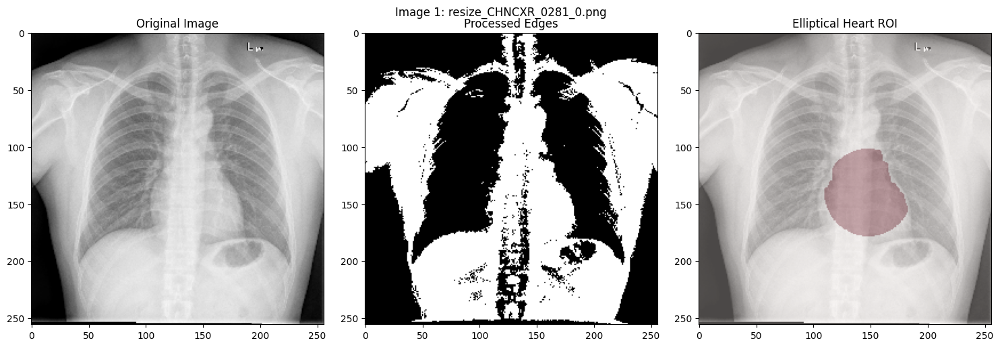


처리 중인 이미지 2/10: resize_CHNCXR_0606_1.png


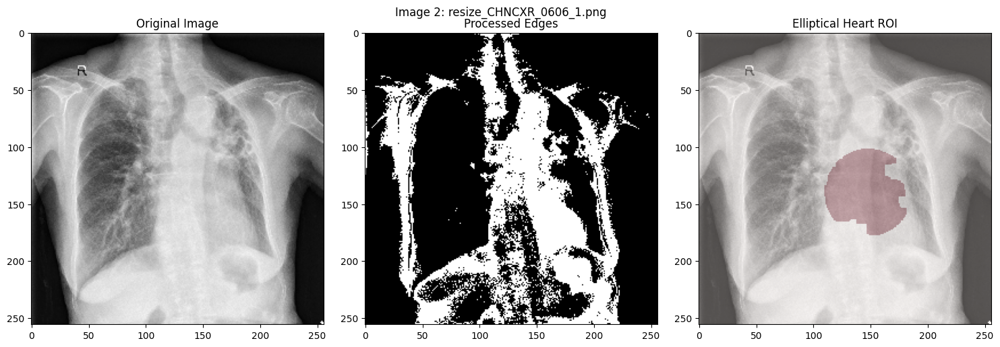


처리 중인 이미지 3/10: resize_CHNCXR_0474_1.png


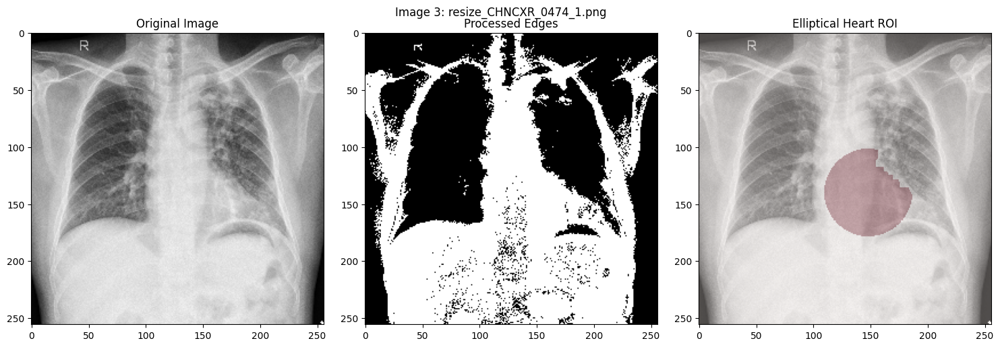


처리 중인 이미지 4/10: resize_CHNCXR_0002_0.png


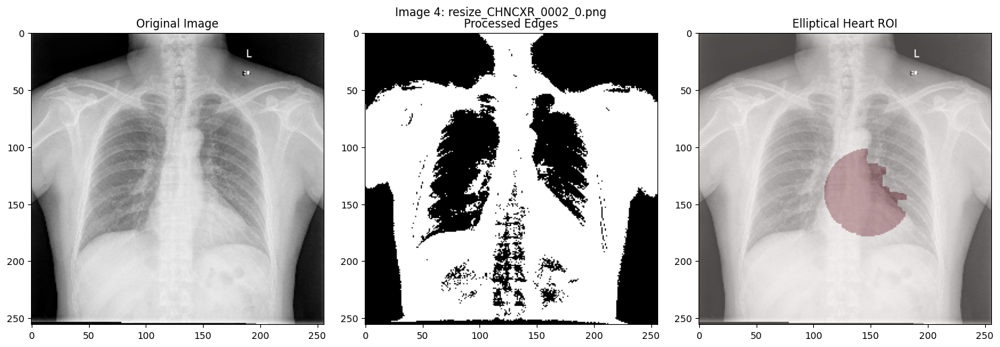


처리 중인 이미지 5/10: resize_CHNCXR_0013_0.png


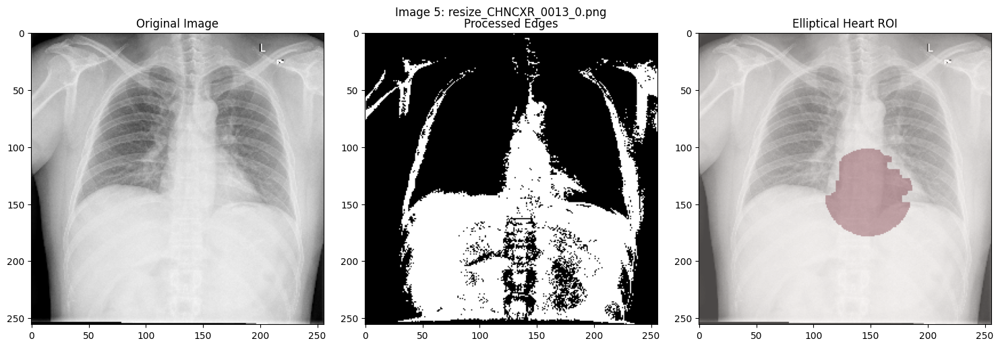


처리 중인 이미지 6/10: resize_CHNCXR_0229_0.png


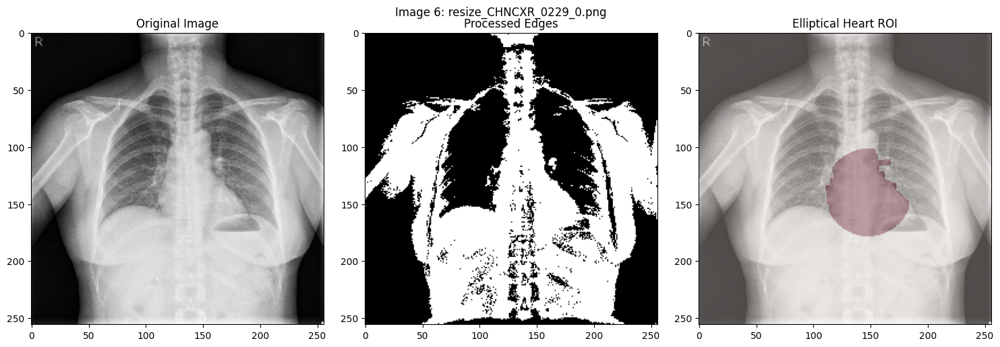


처리 중인 이미지 7/10: resize_CHNCXR_0059_0.png


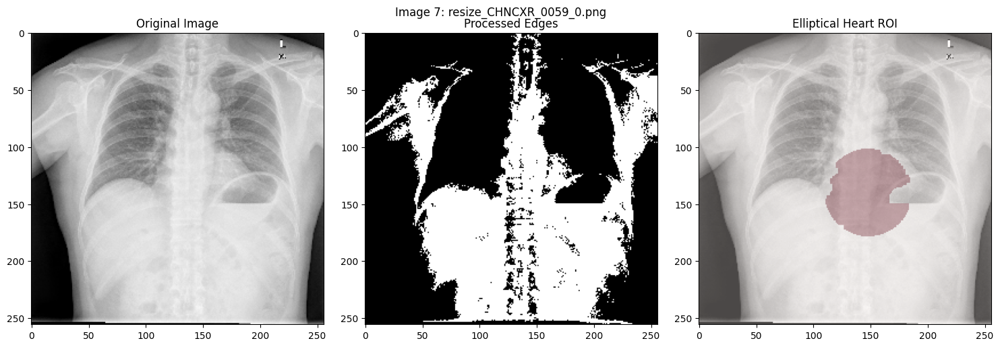


처리 중인 이미지 8/10: resize_CHNCXR_0071_0.png


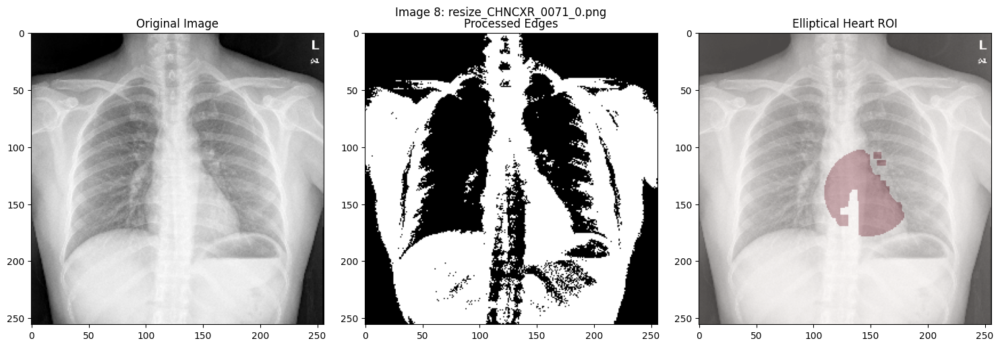


처리 중인 이미지 9/10: resize_CHNCXR_0250_0.png


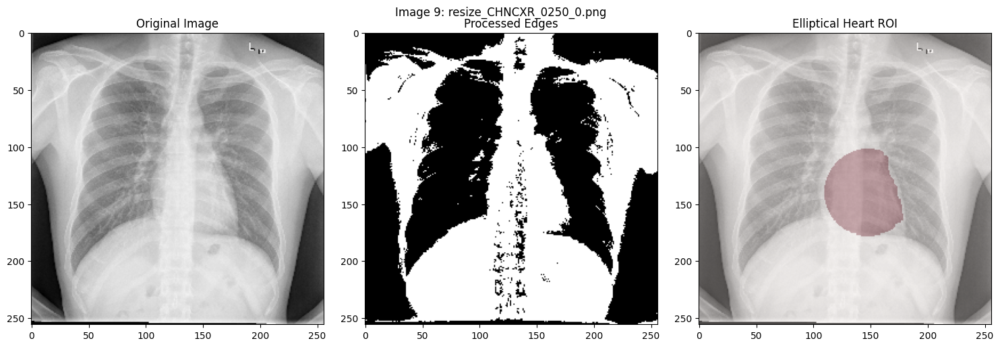


처리 중인 이미지 10/10: resize_CHNCXR_0064_0.png


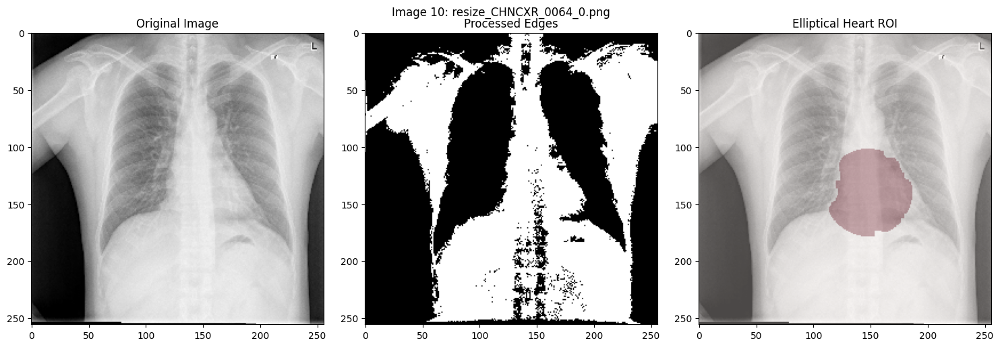

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random

def find_heart_region_dynamic(image):
    height, width = image.shape

    # 1. 이미지 전처리 (이미지의 대비를 높이는 과정)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    #cv2.createCLAHE (Contrast Limited Adaptive Histogram Equalization)을 적용해 국소적 대비 향상
    #CLAHE는 이미지를 작은 영역(타일)로 나누어 각 영역에서 히스토그램 평활화를 적용, 주변 영역 간 경계를 부드럽게 처리
    #세부사항을 잘 보존하면서도 이미지의 품질을 향상시킴
    #clipLimit = 3.0은 대비 제한값(contrast clip)을 설정해 과도한 대비 향상을 억제
    #tileGridSize = (8,8)은 이미지가 나뉘는 타일의 크기 (작은 부분에서의 대비가 개별적으로 향상)

    enhanced = clahe.apply(image)
    blurred = cv2.GaussianBlur(enhanced, (5, 5), 1.4) #원본 이미지에 가우시안 블러 처리 후 노이즈 제거 (5,5)는 커널 크기, 1.4는 블러의 강도

    #이렇게 대비가 향상된 이미지를 다시 가우시안 블러로 부드럽게 하여 노이즈를 줄이고 경계선(에지)를 보다 명확하게 함

    # 2. 엣지 검출 - 임계값 조정
    #블러 처리된 이미지에서 경계를 찾기 위해 Canny 엣지 검출
    #엣지 검출을 수행하는 이유는 심장 주변의 주요 구조물 (폐)의 윤곽을 시각적으로 명확하게 하기 위해
    #그러니까 여기서 심장을 곧바로 알아차린다기 보다는 심장 영역을 찾기 위해 위치를 보정하는 단계
    edges = cv2.Canny(blurred, threshold1=60, threshold2=180)

    # 3. 타원형 ROI 생성
    center_x = width // 2 + int(width * 0.08)
    center_y = int(height * 0.55)
    radius_x = int(width * 0.15)
    radius_y = int(height * 0.15)

    #흉부 이미지에서 심장이 일반적으로 이미지 중앙부를 기준으로 약간 왼쪽에 치우쳐져 있기 때문에 ROI 중심점을 이미지의 우측으로 약간 이동
    #타원 형태로 지정한 이유는 심장 영역을 예측하는 마스크를 지정하려면 타원 형태가 가장 근사할 것으로 판단했기 때문
    #(radius_x,radius_y)는 타원의 크기로 이미지 크기의 일정 비율로 결정

    # 4. 타원형 마스크 생성
    elliptical_mask = np.zeros_like(image)
    cv2.ellipse(elliptical_mask,
                (center_x, center_y),
                (radius_x, radius_y),
                0, 0, 360, 1, -1)
    #cv2.eclipse로 생성한 타원형 마스크의 픽셀값은 1, 나머지는 0
    # 0 0 360 1 -1 각각은 타원의 회전 각도(0도, 수직 및 수평 방향), 0(시작 각도), 360(끝 각도), 1(흰색), -1(내부 전체 채움)
    #즉 타원을 기울이지 않고, 완전한 타원을 그리고 타원의 내부를 모두 흰색 픽셀값으로 채운다

    # 5. ROI 내의 이미지 분석
    roi = image * elliptical_mask
    roi_mean = np.mean(roi[roi > 0])
    roi_std = np.std(roi[roi > 0])
    #타원형 마스크와 원본 이미지를 곱해 마스크 내부의 픽셀만을 가져옴
    #ROI 내부 픽셀만의 평균과 표준편차를 계산
    #두 값들은 심장 영역의 특징적인 픽셀 강도를 나타내며 밝기를 통해 심장 부위만을 보다 정밀하게 찾음

    # 6. 밝기값 기반 심장 영역 검출
    heart_mask = np.zeros_like(image)
    heart_region = (image > (roi_mean - roi_std)) & (image < (roi_mean + roi_std))
    heart_mask[heart_region] = 1
    #ROI의 밝기 범위 안에 포함되는 픽셀만 심장 영역으로 가정해 심장 마스크를 생성
    #픽셀값이 [평균-표준편차, 평균+표준편차] 일 경우에만 심장으로 가정
    #픽셀 밝기 특징을 이용해 보다 정확한 위치만을 선택적으로 탐색

    # 7. 타원형 마스크와 결합
    final_mask = heart_mask * elliptical_mask
    #밝기기반 마스크(heart_mask)와 타원형 마스크(elliptical_mask)를 결합
    #교집합을 구하는 원리와 같아 두 마스크가 동시 적용되는 영역만을 최종 심장 영역으로 판단

    # 8. 형태학적 연산으로 정제
    kernel = np.ones((5,5), np.uint8)
    final_mask = cv2.morphologyEx(final_mask.astype(np.uint8),
                                cv2.MORPH_CLOSE, kernel)
    final_mask = cv2.morphologyEx(final_mask,
                                cv2.MORPH_OPEN, kernel)
    #모폴로지 닫힘 연산으로 심장 영역의 작은 구멍들을 채우고 연결된 구조를 매끄럽게 함
    #모폴로지 열림 연산으로 작은 노이즈들만을 제거
    #최종 얻어지는 마스크가 보다 깔끔하고, 실제 영역을 최대한 대변할 수 있게끔 정제

    return final_mask, edges, heart_mask

def process_multiple_images(image_folder, num_images=10):
    # 이미지 파일 목록 가져오기
    image_files = [f for f in os.listdir(image_folder) if f.endswith(('.png', '.jpg', '.jpeg'))]

    if not image_files:
        raise ValueError("이미지 파일이 폴더에 없습니다.")

    # 랜덤으로 이미지 선택
    selected_images = random.sample(image_files, min(num_images, len(image_files)))

    for idx, image_file in enumerate(selected_images, 1):
        image_path = os.path.join(image_folder, image_file)
        print(f"\n처리 중인 이미지 {idx}/10: {image_file}")

        # 이미지 로드
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

        if image is None:
            print(f"이미지를 불러올 수 없습니다: {image_file}")
            continue

        # 심장 영역 검출
        heart_mask, edges, edges_processed = find_heart_region_dynamic(image)

        # 결과 시각화
        plt.figure(figsize=(15, 5))

        plt.subplot(131)
        plt.imshow(image, cmap='gray')
        plt.title('Original Image')

        plt.subplot(132)
        plt.imshow(edges_processed, cmap='gray')
        plt.title('Processed Edges')

        plt.subplot(133)
        plt.imshow(image, cmap='gray')
        plt.imshow(heart_mask, cmap='Reds', alpha=0.3)
        plt.title('Elliptical Heart ROI')

        plt.suptitle(f'Image {idx}: {image_file}')
        plt.tight_layout()
        plt.show()

# 메인 실행 코드
image_folder = '/content/heart_included_masks/images'
process_multiple_images(image_folder, num_images=10)

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random

def find_heart_region_dynamic(image):
    height, width = image.shape

    # 1. 이미지 전처리 (이미지의 대비를 높이는 과정)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    enhanced = clahe.apply(image)
    blurred = cv2.GaussianBlur(enhanced, (5, 5), 1.4)

    # 2. 엣지 검출 - 임계값 조정
    edges = cv2.Canny(blurred, threshold1=30, threshold2=150)

    # 3. 타원형 ROI 생성
    center_x = width // 2 + int(width * 0.08)
    center_y = int(height * 0.5)
    radius_x = int(width * 0.15)
    radius_y = int(height * 0.15)

    # 4. 타원형 마스크 생성
    elliptical_mask = np.zeros_like(image)
    cv2.ellipse(elliptical_mask,
                (center_x, center_y),
                (radius_x, radius_y),
                0, 0, 360, 1, -1)


    # 5. ROI 내의 이미지 분석
    roi = image * elliptical_mask
    roi_mean = np.mean(roi[roi > 0])
    roi_std = np.std(roi[roi > 0])


    # 6. 밝기값 기반 심장 영역 검출
    heart_mask = np.zeros_like(image)
    heart_region = (image > (roi_mean - roi_std)) & (image < (roi_mean + roi_std))
    heart_mask[heart_region] = 1


    # 7. 타원형 마스크와 결합
    final_mask = heart_mask * elliptical_mask


    # 8. 형태학적 연산으로 정제
    kernel = np.ones((5,5), np.uint8)
    final_mask = cv2.morphologyEx(final_mask.astype(np.uint8),
                                cv2.MORPH_CLOSE, kernel)
    final_mask = cv2.morphologyEx(final_mask,
                                cv2.MORPH_OPEN, kernel)

    return final_mask, edges, heart_mask

def process_lung_masks(image_folder, mask_folder):
    # 이미지와 마스크 파일 목록 가져오기
    image_files = [f for f in os.listdir(image_folder) if f.endswith(('.png', '.jpg', '.jpeg'))]
    mask_files = [f for f in os.listdir(mask_folder) if f.endswith(('.png', '.jpg', '.jpeg'))]

    # 결과 저장할 새 디렉토리 생성
    output_folder = '/content/lung_masks_heart_removal'
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
        print(f"새 폴더 생성됨: {output_folder}")

    processed_count = 0

    for image_file in image_files:
        # 해당하는 마스크 파일 찾기
        if image_file not in mask_files:
            print(f"마스크를 찾을 수 없습니다: {image_file}")
            continue

        # 이미지와 마스크 로드
        image_path = os.path.join(image_folder, image_file)
        mask_path = os.path.join(mask_folder, image_file)

        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        lung_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        if image is None or lung_mask is None:
            print(f"이미지 또는 마스크를 불러올 수 없습니다: {image_file}")
            continue

        # 심장 영역 검출
        heart_mask, edges, edges_processed = find_heart_region_dynamic(image)

        # 심장 마스크를 이진화 (0 또는 255로)
        heart_mask = (heart_mask > 0).astype(np.uint8) * 255

        # 폐 마스크에서 심장 영역 제거
        lung_without_heart = cv2.bitwise_and(lung_mask, cv2.bitwise_not(heart_mask))

        # 결과 저장
        output_path = os.path.join(output_folder, image_file)
        cv2.imwrite(output_path, lung_without_heart)

        processed_count += 1
        print(f"처리 완료 ({processed_count}/56): {image_file}")

    return processed_count

# 실행
image_folder = '/content/heart_included_masks/images'
mask_folder = '/content/heart_included_masks/masks'
processed_count = process_lung_masks(image_folder, mask_folder)

print(f"\n처리 완료! 총 {processed_count}개의 마스크가 저장되었습니다.")
print(f"저장 위치: /content/lung_masks_heart_removal")

새 폴더 생성됨: /content/lung_masks_heart_removal
처리 완료 (1/56): resize_CHNCXR_0423_1.png
처리 완료 (2/56): resize_CHNCXR_0020_0.png
처리 완료 (3/56): resize_CHNCXR_0592_1.png
처리 완료 (4/56): resize_CHNCXR_0002_0.png
처리 완료 (5/56): resize_CHNCXR_0558_1.png
처리 완료 (6/56): resize_CHNCXR_0370_1.png
처리 완료 (7/56): resize_CHNCXR_0507_1.png
처리 완료 (8/56): resize_CHNCXR_0013_0.png
처리 완료 (9/56): resize_CHNCXR_0340_1.png
처리 완료 (10/56): resize_CHNCXR_0281_0.png
처리 완료 (11/56): resize_CHNCXR_0178_0.png
처리 완료 (12/56): resize_CHNCXR_0230_0.png
처리 완료 (13/56): resize_CHNCXR_0513_1.png
처리 완료 (14/56): resize_CHNCXR_0527_1.png
처리 완료 (15/56): resize_CHNCXR_0582_1.png
처리 완료 (16/56): resize_CHNCXR_0337_1.png
처리 완료 (17/56): resize_CHNCXR_0448_1.png
처리 완료 (18/56): resize_CHNCXR_0327_1.png
처리 완료 (19/56): resize_CHNCXR_0526_1.png
처리 완료 (20/56): resize_CHNCXR_0016_0.png
처리 완료 (21/56): resize_CHNCXR_0368_1.png
처리 완료 (22/56): resize_CHNCXR_0569_1.png
처리 완료 (23/56): resize_CHNCXR_0290_0.png
처리 완료 (24/56): resize_CHNCXR_0229_0.png
처리 완료

결과 시각화

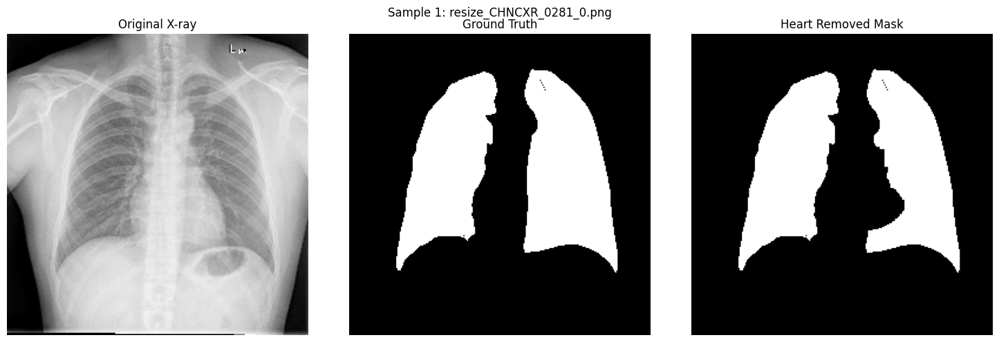

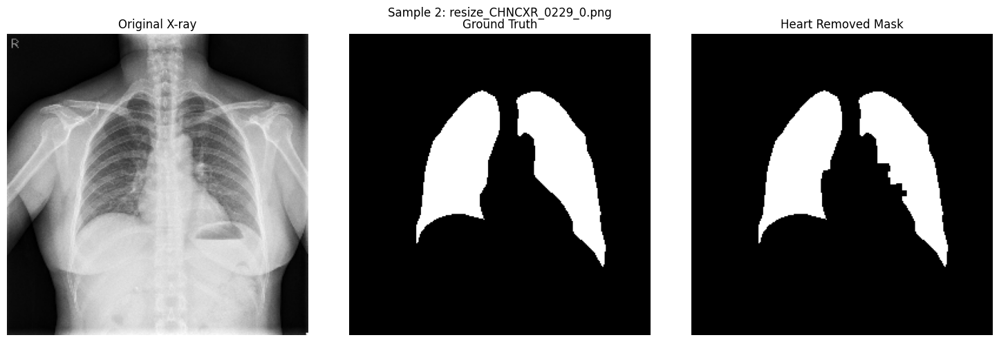

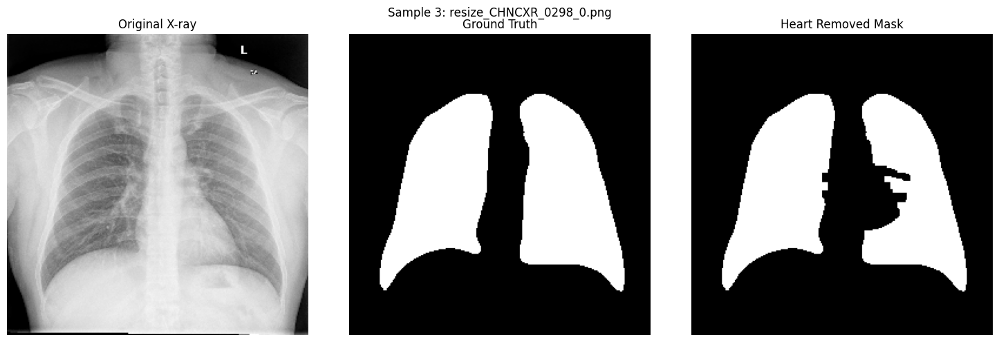

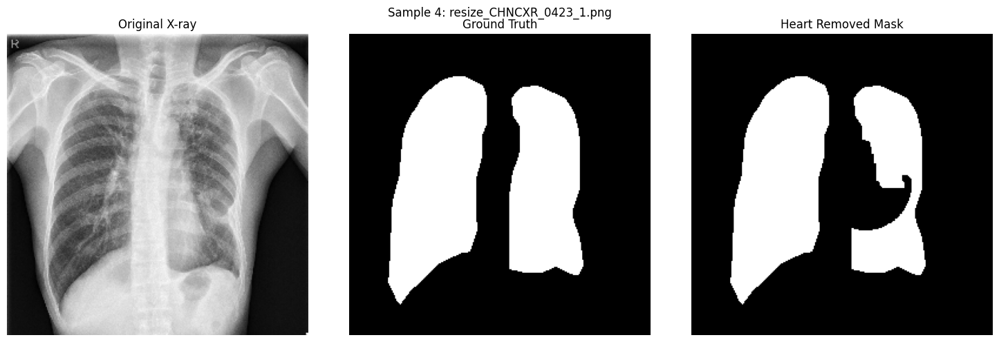

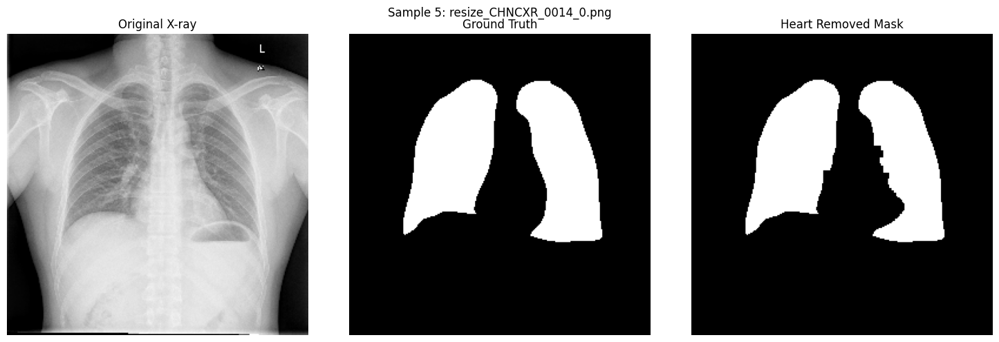

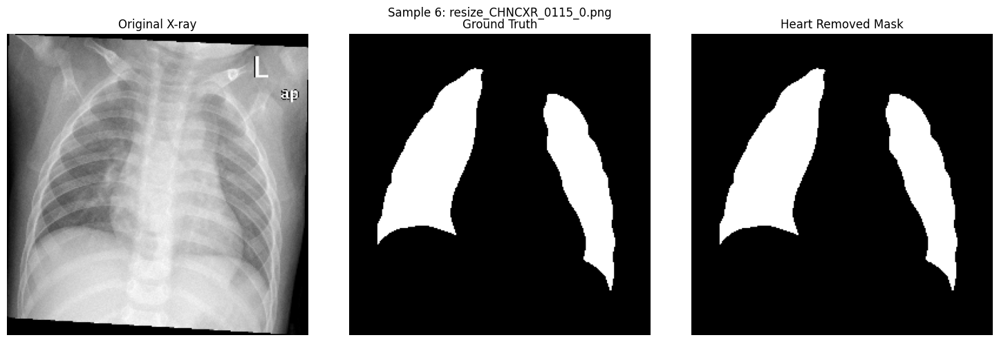

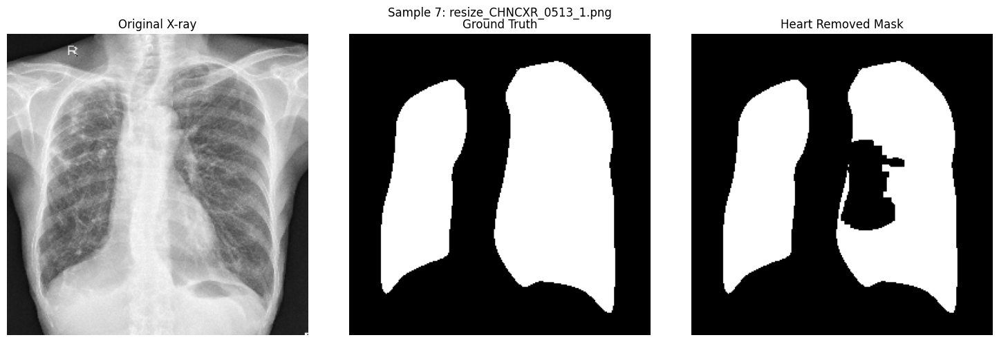

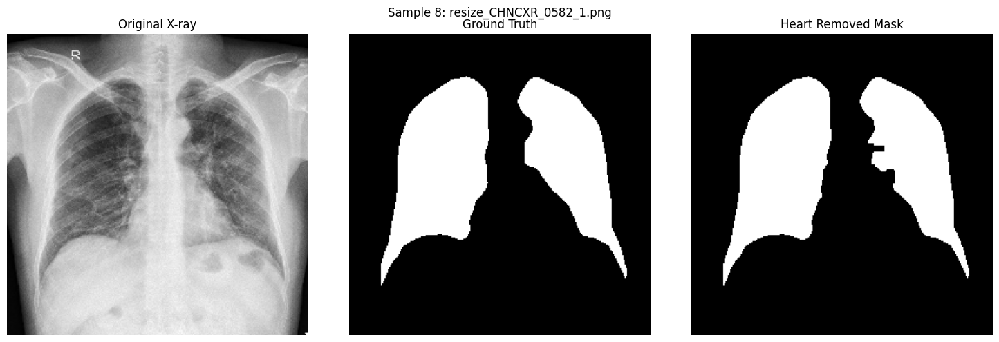

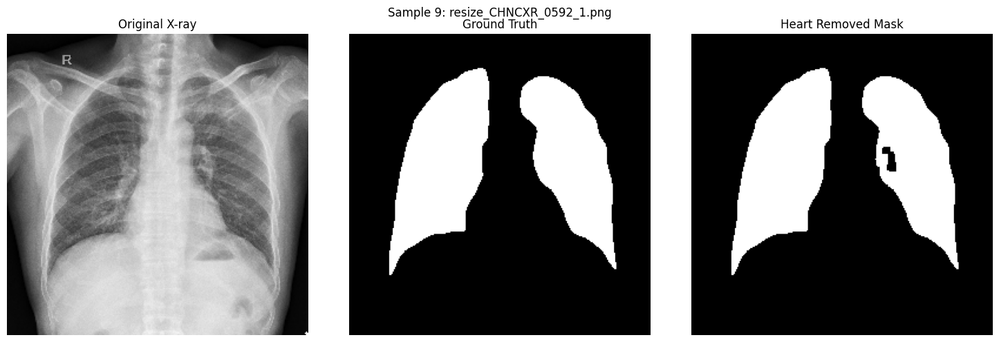

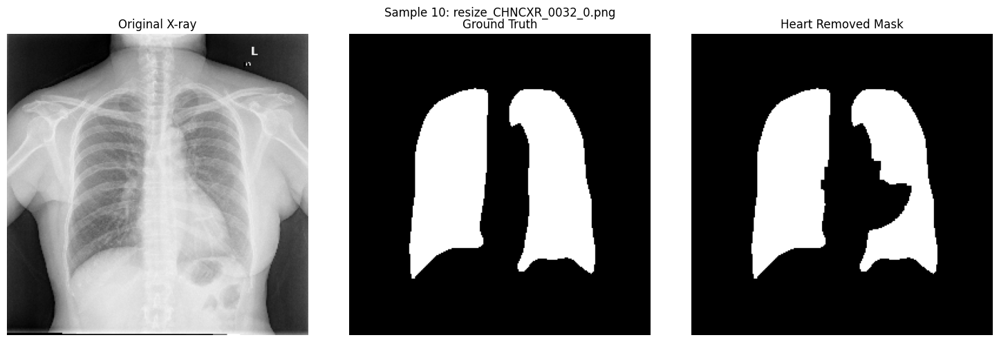

In [ ]:
def visualize_results(original_folder, gt_folder, heart_removed_folder, num_samples=10):
    # 이미지 파일 목록 가져오기
    heart_removed_files = [f for f in os.listdir(heart_removed_folder) if f.endswith(('.png', '.jpg', '.jpeg'))]

    if len(heart_removed_files) < num_samples:
        print(f"요청한 샘플 수({num_samples})가 가용 이미지 수({len(heart_removed_files)})보다 많습니다.")
        num_samples = len(heart_removed_files)

    # 랜덤 샘플링
    selected_files = random.sample(heart_removed_files, num_samples)

    for idx, image_file in enumerate(selected_files, 1):
        # 각 이미지 경로
        original_path = os.path.join(original_folder, image_file)
        gt_path = os.path.join(gt_folder, image_file)
        heart_removed_path = os.path.join(heart_removed_folder, image_file)

        # 이미지 로드
        original = cv2.imread(original_path, cv2.IMREAD_GRAYSCALE)
        gt = cv2.imread(gt_path, cv2.IMREAD_GRAYSCALE)
        heart_removed = cv2.imread(heart_removed_path, cv2.IMREAD_GRAYSCALE)

        if original is None or gt is None or heart_removed is None:
            print(f"이미지를 불러올 수 없습니다: {image_file}")
            continue

        # 시각화
        plt.figure(figsize=(15, 5))

        plt.subplot(131)
        plt.imshow(original, cmap='gray')
        plt.title('Original X-ray')
        plt.axis('off')

        plt.subplot(132)
        plt.imshow(gt, cmap='gray')
        plt.title('Ground Truth')
        plt.axis('off')

        plt.subplot(133)
        plt.imshow(heart_removed, cmap='gray')
        plt.title('Heart Removed Mask')
        plt.axis('off')

        plt.suptitle(f'Sample {idx}: {image_file}')
        plt.tight_layout()
        plt.show()

# 실행
original_folder = '/content/heart_included_masks/images'
gt_folder = '/content/label'
heart_removed_folder = '/content/lung_masks_heart_removal'

visualize_results(original_folder, gt_folder, heart_removed_folder, num_samples=10)

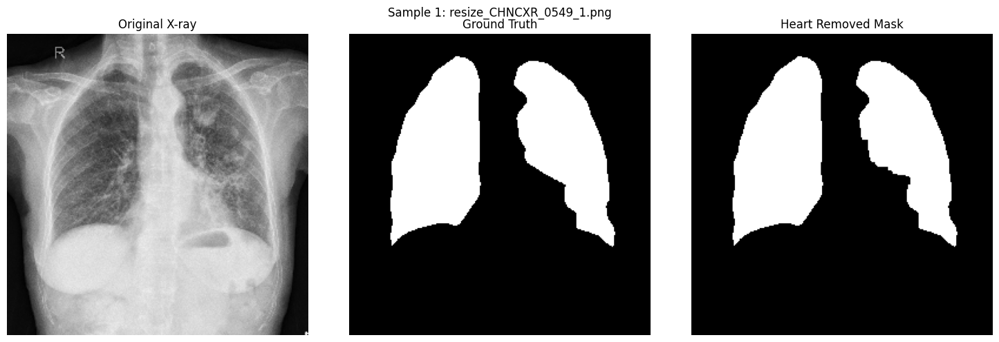

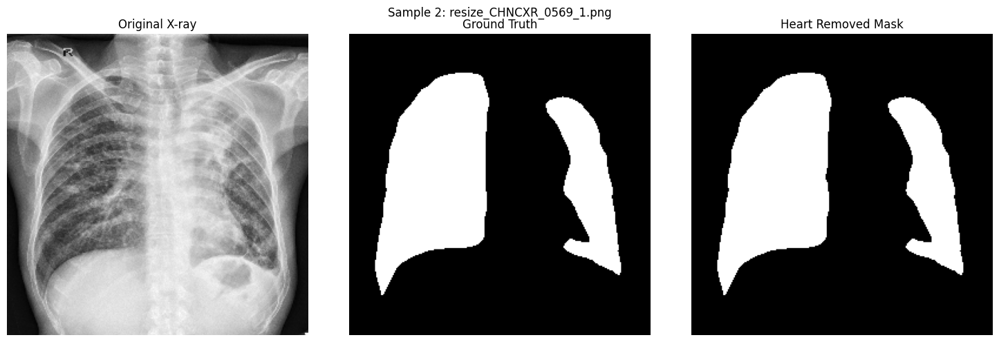

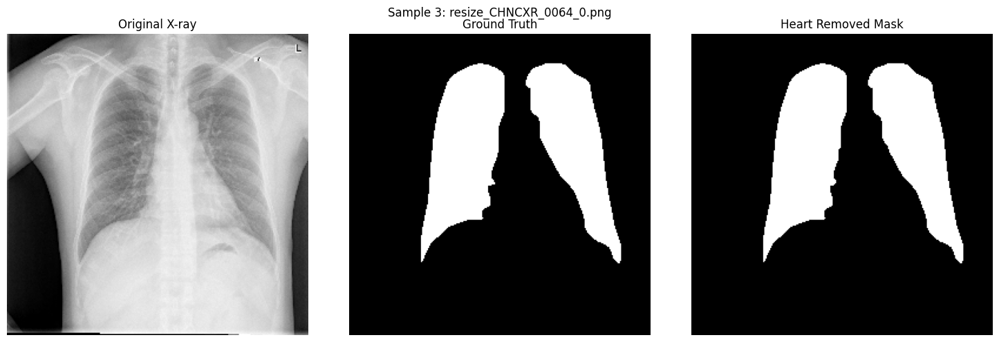

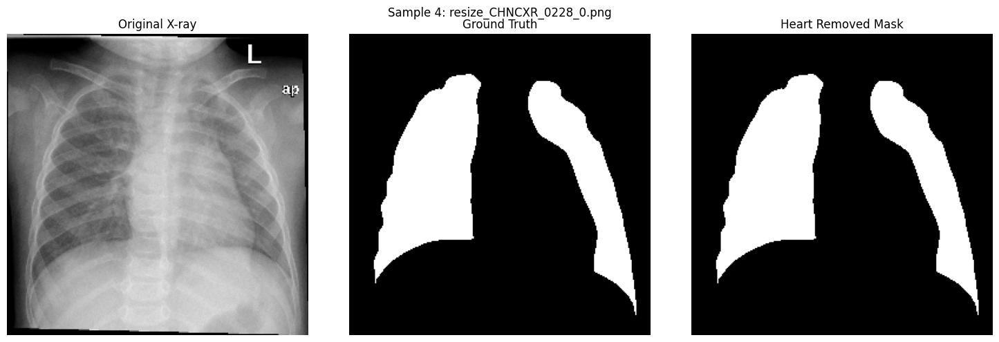

In [ ]:
def visualize_specific_images(original_folder, gt_folder, heart_removed_folder, image_ids):
    # 폴더 내 모든 파일 목록 가져오기
    heart_removed_files = os.listdir(heart_removed_folder)

    for idx, image_id in enumerate(image_ids, 1):
        # 해당 ID를 포함하는 파일 찾기
        matching_files = [f for f in heart_removed_files if image_id in f]

        if not matching_files:
            print(f"이미지 ID {image_id}에 해당하는 파일을 찾을 수 없습니다.")
            continue

        # 첫 번째 매칭 파일 사용 (여러 개가 있을 경우)
        image_file = matching_files[0]

        # 각 이미지 경로
        original_path = os.path.join(original_folder, image_file)
        gt_path = os.path.join(gt_folder, image_file)
        heart_removed_path = os.path.join(heart_removed_folder, image_file)

        # 이미지 로드
        original = cv2.imread(original_path, cv2.IMREAD_GRAYSCALE)
        gt = cv2.imread(gt_path, cv2.IMREAD_GRAYSCALE)
        heart_removed = cv2.imread(heart_removed_path, cv2.IMREAD_GRAYSCALE)

        if original is None or gt is None or heart_removed is None:
            print(f"이미지를 불러올 수 없습니다: {image_file}")
            print(f"경로 확인: \n원본: {original_path}\nGT: {gt_path}\n심장제거: {heart_removed_path}")
            continue

        # 시각화
        plt.figure(figsize=(15, 5))

        plt.subplot(131)
        plt.imshow(original, cmap='gray')
        plt.title('Original X-ray')
        plt.axis('off')

        plt.subplot(132)
        plt.imshow(gt, cmap='gray')
        plt.title('Ground Truth')
        plt.axis('off')

        plt.subplot(133)
        plt.imshow(heart_removed, cmap='gray')
        plt.title('Heart Removed Mask')
        plt.axis('off')

        plt.suptitle(f'Sample {idx}: {image_file}')
        plt.tight_layout()
        plt.show()

# 실행
original_folder = '/content/heart_included_masks/images'
gt_folder = '/content/label'
heart_removed_folder = '/content/lung_masks_heart_removal'

# 특정 이미지 ID 목록
specific_image_ids = ['0549', '0569', '0064', '0228']

# 특정 이미지 시각화 함수 호출
visualize_specific_images(original_folder, gt_folder, heart_removed_folder, specific_image_ids)